In [3]:
import json
from pandas import json_normalize
import pandas as pd
import sklearn
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA

import seaborn as sns

In [4]:
# !pip install statsbombpy
# !pip install mplsoccer

pd.set_option('display.max_seq_items', None)

In [5]:
from mplsoccer.pitch import Pitch
from mplsoccer import Pitch, Sbopen
# from mplsoccer.statsbomb import read_event, EVENT_SLUG
from matplotlib import rcParams

In [6]:
wc19 =pd.read_pickle('wc19.pkl')
wc19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43744 entries, 0 to 43743
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   period                         43744 non-null  int64  
 1   pass_angle                     43744 non-null  float64
 2   pass_length                    43744 non-null  float64
 3   pass_recipient                 43744 non-null  object 
 4   possession_team                43744 non-null  object 
 5   possession_team_id             43744 non-null  int64  
 6   player                         43744 non-null  object 
 7   player_id                      43744 non-null  float64
 8   match_id                       43744 non-null  int64  
 9   pass_outcome_Complete          43744 non-null  uint8  
 10  pass_outcome_Incomplete        43744 non-null  uint8  
 11  pass_outcome_Injury Clearance  43744 non-null  uint8  
 12  pass_outcome_Out               43744 non-null 

In [7]:
euro22 =pd.read_pickle('euro22.pkl')
euro22.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26002 entries, 0 to 26001
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   period                         26002 non-null  int64  
 1   pass_angle                     26002 non-null  float64
 2   pass_length                    26002 non-null  float64
 3   pass_recipient                 26002 non-null  object 
 4   possession_team                26002 non-null  object 
 5   possession_team_id             26002 non-null  int64  
 6   player                         26002 non-null  object 
 7   player_id                      26002 non-null  float64
 8   match_id                       26002 non-null  int64  
 9   pass_outcome_Complete          26002 non-null  uint8  
 10  pass_outcome_Incomplete        26002 non-null  uint8  
 11  pass_outcome_Injury Clearance  26002 non-null  uint8  
 12  pass_outcome_Out               26002 non-null 

In [8]:
euro22.pass_outcome_Unknown.value_counts()


0    25959
1       43
Name: pass_outcome_Unknown, dtype: int64

In [9]:
# a function to draw the pitch, and plot the passes on the pitch, split complete & incomplete passes
# based on a player's passes in a competition

def playerpasses(name,comp):

    pitch = Pitch(pitch_type='statsbomb', pitch_color='#22312b', line_color='#c7d5cc')
    fig, ax = pitch.draw(figsize=(16, 11), constrained_layout=True, tight_layout=False)

    pass_incomplete = ['pass_outcome_Incomplete',
                       'pass_outcome_Injury Clearance',
                            'pass_outcome_Out',
                           'pass_outcome_Pass Offside',
                           'pass_outcome_Unknown']
    
    #if thepass['team_name']==away_team_required: #
    for i,thepass in comp.iterrows():
        if thepass['player']==name and thepass['pass_outcome_Complete'] == 1:
            plot_pass_c = pitch.arrows(thepass['start_x'], 
                                    thepass['start_y'],
                                    thepass['end_x'],
                                    thepass['end_y'],
                                         width=2,
                                         headwidth=6, 
                                         headlength=5, 
                                         headaxislength=12,
                                         color='#ad993c',
                                         ax=ax)
        
            
            
    for i,thepass in comp.iterrows():
        
        if thepass['player']==name and thepass['pass_outcome_Complete'] == 0:
            plot_pass_i = pitch.arrows(thepass['start_x'], 
                                    thepass['start_y'],
                                    thepass['end_x'],
                                    thepass['end_y'],
                                         width=2,
                                         headwidth=6, 
                                         headlength=5, 
                                         headaxislength=12,
                                         color='#ba4f45',
                                     ax=ax)
        

# Set up the legend
    red_patch = mpatches.Patch(color='#ad993c', label='completed passes')
    yellow_patch = mpatches.Patch(color='#ba4f45', label='other passes')
    ax.legend(handles=[red_patch,yellow_patch], fontsize=20, loc='upper left')
    #ax.legend(["completed passes", "other passes"], facecolor='#22312b', handlelength=5, edgecolor='None', fontsize=20, loc='upper left')

# Set the title
    ax_title = ax.set_title(f'Passes', fontsize=30)

In [10]:
# a function to draw the pitch, and plot the passes on the pitch, split in halves
# based on a player's passes in a competition


def playerpasses_inhalves(name,comp):

    pitch = Pitch(pitch_type='statsbomb', pitch_color='#22312b', line_color='#c7d5cc')
    fig, ax = pitch.draw(figsize=(16, 11), constrained_layout=True, tight_layout=False)

    pass_incomplete = ['pass_outcome_Incomplete',
                       'pass_outcome_Injury Clearance',
                            'pass_outcome_Out',
                           'pass_outcome_Pass Offside',
                           'pass_outcome_Unknown']
    
    #if thepass['team_name']==away_team_required: #
    for i,thepass in comp.iterrows():
        if thepass['player']==name and thepass['period'] == 1:
            plot_pass_c = pitch.arrows(thepass['start_x'], 
                                    thepass['start_y'],
                                    thepass['end_x'],
                                    thepass['end_y'],
                                         width=2,
                                         headwidth=6, 
                                         headlength=5, 
                                         headaxislength=12,
                                         color='#ad993c',
                                         ax=ax)
        
            
            
    for i,thepass in comp.iterrows():
        
        if thepass['player']==name and thepass['period'] == 2:
            plot_pass_i = pitch.arrows(thepass['start_x'], 
                                    thepass['start_y'],
                                    thepass['end_x'],
                                    thepass['end_y'],
                                         width=2,
                                         headwidth=6, 
                                         headlength=5, 
                                         headaxislength=12,
                                         color='#ba4f45',
                                     ax=ax)
        
                             

            
# Set up the legend
    red_patch = mpatches.Patch(color='#ad993c', label='first half')
    yellow_patch = mpatches.Patch(color='#ba4f45', label='second half')
    ax.legend(handles=[red_patch,yellow_patch], fontsize=20, loc='upper left')
    #ax.legend(["completed passes", "other passes"], facecolor='#22312b', handlelength=5, edgecolor='None', fontsize=20, loc='upper left')

# Set the title
    ax_title = ax.set_title(f'Passes', fontsize=30)

In [11]:
# a function to draw the pitch, and plot the passes on the pitch, split complete & incomplete passes
# based on a team's passes in a competition

def teampasses(team_id,comp):

    pitch = Pitch(pitch_type='statsbomb', pitch_color='#22312b', line_color='#c7d5cc')
    fig, ax = pitch.draw(figsize=(16, 11), constrained_layout=True, tight_layout=False)

    pass_incomplete = ['pass_outcome_Incomplete',
                       'pass_outcome_Injury Clearance',
                            'pass_outcome_Out',
                           'pass_outcome_Pass Offside',
                           'pass_outcome_Unknown']
    
    #if thepass['team_name']==away_team_required: #
    for i,thepass in comp.iterrows():
        if thepass['possession_team_id']==team_id and thepass['pass_outcome_Complete'] == 1:
            plot_pass_c = pitch.arrows(thepass['start_x'], 
                                    thepass['start_y'],
                                    thepass['end_x'],
                                    thepass['end_y'],
                                         width=2,
                                         headwidth=6, 
                                         headlength=5, 
                                         headaxislength=12,
                                         color='#ad993c',
                                         ax=ax)
        
            
            
    for i,thepass in comp.iterrows():
        
        if thepass['possession_team_id']==team_id and thepass['pass_outcome_Complete'] == 0:
            plot_pass_i = pitch.arrows(thepass['start_x'], 
                                    thepass['start_y'],
                                    thepass['end_x'],
                                    thepass['end_y'],
                                         width=2,
                                         headwidth=6, 
                                         headlength=5, 
                                         headaxislength=12,
                                         color='#ba4f45',
                                     ax=ax)
        

# Set up the legend
    red_patch = mpatches.Patch(color='#ad993c', label='completed passes')
    yellow_patch = mpatches.Patch(color='#ba4f45', label='other passes')
    ax.legend(handles=[red_patch,yellow_patch], fontsize=20, loc='upper left')
    #ax.legend(["completed passes", "other passes"], facecolor='#22312b', handlelength=5, edgecolor='None', fontsize=20, loc='upper left')

# Set the title
    ax_title = ax.set_title(f'Passes', fontsize=30)

In [12]:
# a function to draw the pitch, and plot the passes on the pitch, split in halves
# based on a team's passes in a competition

def teampasses_inhalves(team_id,comp):

    pitch = Pitch(pitch_type='statsbomb', pitch_color='#22312b', line_color='#c7d5cc')
    fig, ax = pitch.draw(figsize=(16, 11), constrained_layout=True, tight_layout=False)

    pass_incomplete = ['pass_outcome_Incomplete',
                       'pass_outcome_Injury Clearance',
                            'pass_outcome_Out',
                           'pass_outcome_Pass Offside',
                           'pass_outcome_Unknown']
    
    #if thepass['team_name']==away_team_required: #
    for i,thepass in comp.iterrows():
        if thepass['possession_team_id']==team_id and thepass['period'] == 1:
            plot_pass_c = pitch.arrows(thepass['start_x'], 
                                    thepass['start_y'],
                                    thepass['end_x'],
                                    thepass['end_y'],
                                         width=2,
                                         headwidth=6, 
                                         headlength=5, 
                                         headaxislength=12,
                                         color='#ad993c',
                                         ax=ax)
        
            
            
    for i,thepass in comp.iterrows():
        
        if thepass['possession_team_id']==team_id and thepass['period'] == 2:
            plot_pass_i = pitch.arrows(thepass['start_x'], 
                                    thepass['start_y'],
                                    thepass['end_x'],
                                    thepass['end_y'],
                                         width=2,
                                         headwidth=6, 
                                         headlength=5, 
                                         headaxislength=12,
                                         color='#ba4f45',
                                     ax=ax)
        
                             

            
# Set up the legend
    red_patch = mpatches.Patch(color='#ad993c', label='first half')
    yellow_patch = mpatches.Patch(color='#ba4f45', label='second half')
    ax.legend(handles=[red_patch,yellow_patch], fontsize=20, loc='upper left')
    #ax.legend(["completed passes", "other passes"], facecolor='#22312b', handlelength=5, edgecolor='None', fontsize=20, loc='upper left')

# Set the title
    ax_title = ax.set_title(f'Passes', fontsize=30)

In [13]:
#865 is the England Women's Team
glossary_eur = euro22[euro22['possession_team_id'] == 865]

In [14]:
for_ref = euro22.groupby(['player', 'player_id']).count()

In [15]:
# 2,969 passes, 2,693 completed
glossary_eur.pass_outcome_Complete.value_counts()

1    2693
0     276
Name: pass_outcome_Complete, dtype: int64

In [16]:
wc19[wc19['possession_team_id'] == 865].pass_outcome_Complete.value_counts()

1    3199
0     609
Name: pass_outcome_Complete, dtype: int64

In [17]:
#create glossary of player name and player_id for easy reference
pd.set_option('display.max_rows', None)
for_ref

,,period,pass_angle,pass_length,pass_recipient,possession_team,possession_team_id,match_id,pass_outcome_Complete,pass_outcome_Incomplete,pass_outcome_Injury Clearance,pass_outcome_Out,pass_outcome_Pass Offside,pass_outcome_Unknown,start_x,start_y,end_x,end_y,pass_height_Ground Pass,pass_height_High Pass,pass_height_Low Pass
player,player_id,,,,,,,,,,,,,,,,,,,,
Abbie Magee,276295.0,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35
Ada Stolsmo Hegerberg,10385.0,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58
Adelina Engman,17273.0,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
Agla María Albertsdóttir,10134.0,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17
Agnese Bonfantini,45883.0,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
Aitana Bonmati Conca,15284.0,289,289,289,289,289,289,289,289,289,289,289,289,289,289,289,289,289,289,289,289
Alessia Russo,47521.0,41,41,41,41,41,41,41,41,41,41,41,41,41,41,41,41,41,41,41,41
Alex Greenwood,10252.0,143,143,143,143,143,143,143,143,143,143,143,143,143,143,143,143,143,143,143,143
Alexandra Jóhannsdóttir,32456.0,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9


### Pre Modelling EDA - England Womens passing in Euro 2022

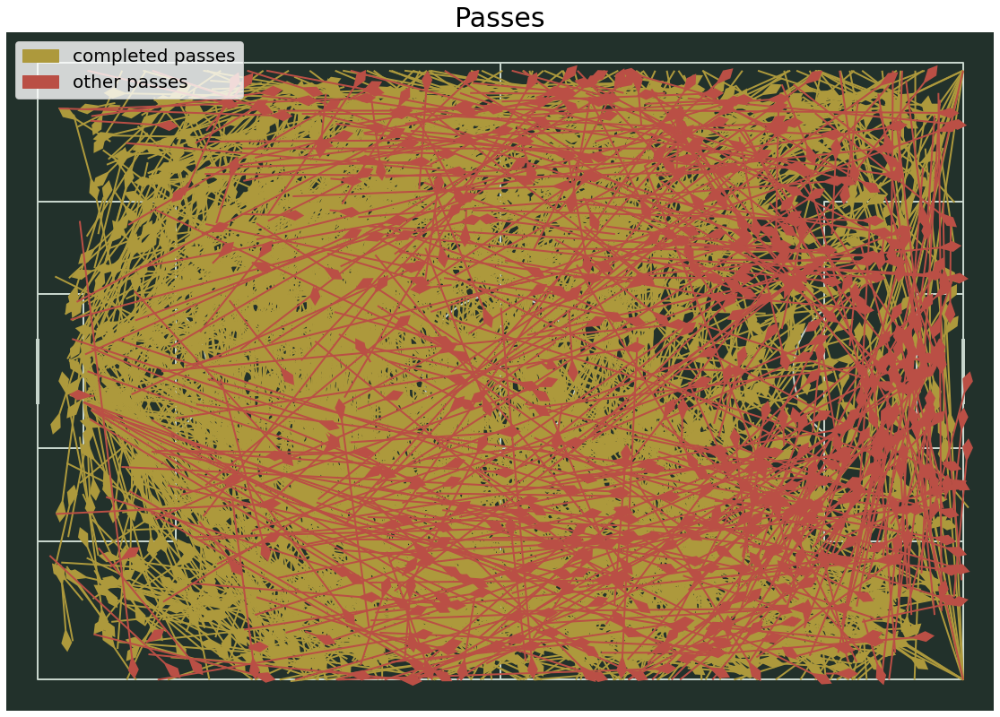

In [18]:
teampasses(865,wc19)

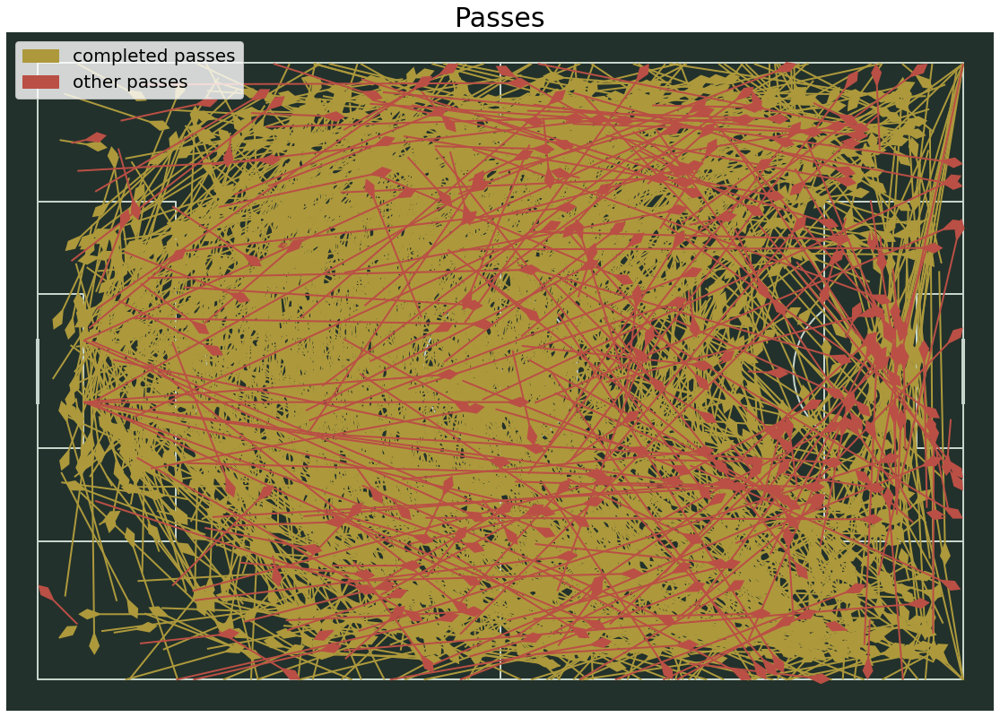

In [19]:
teampasses(865,euro22)

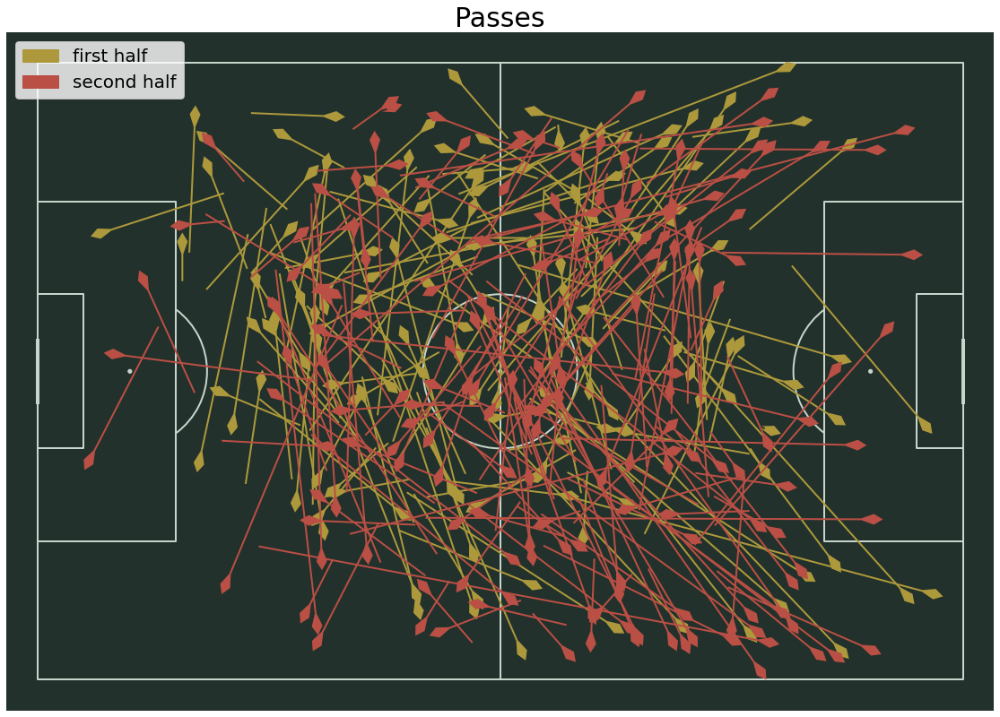

In [20]:
playerpasses_inhalves('Keira Walsh',euro22)

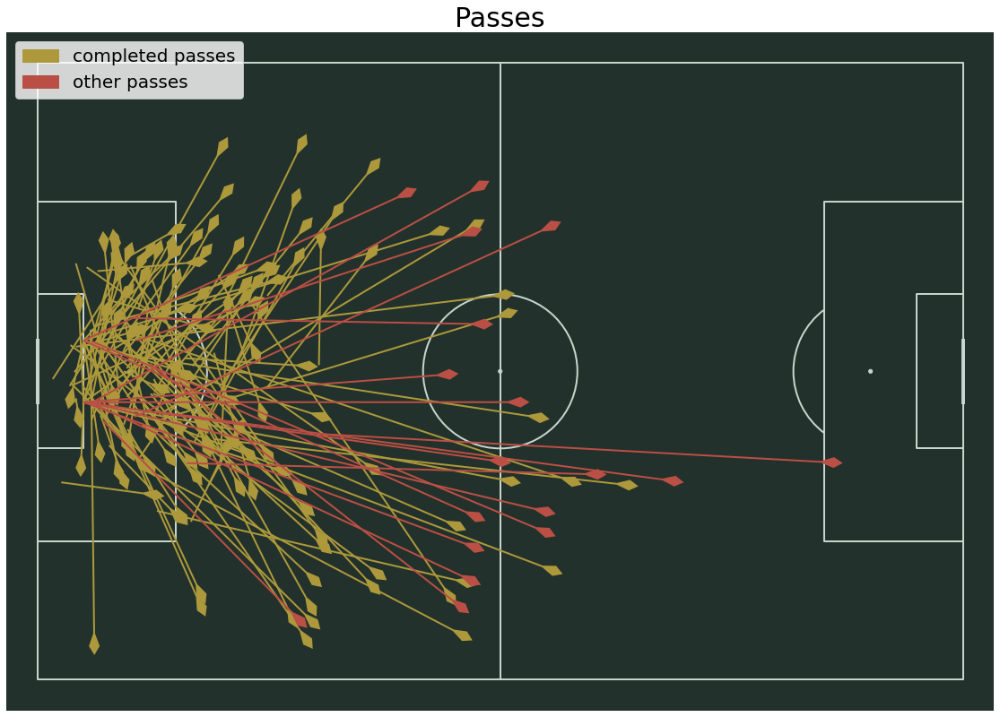

In [21]:
#Keeper for England womens
playerpasses('Mary Alexandra Earps',euro22)

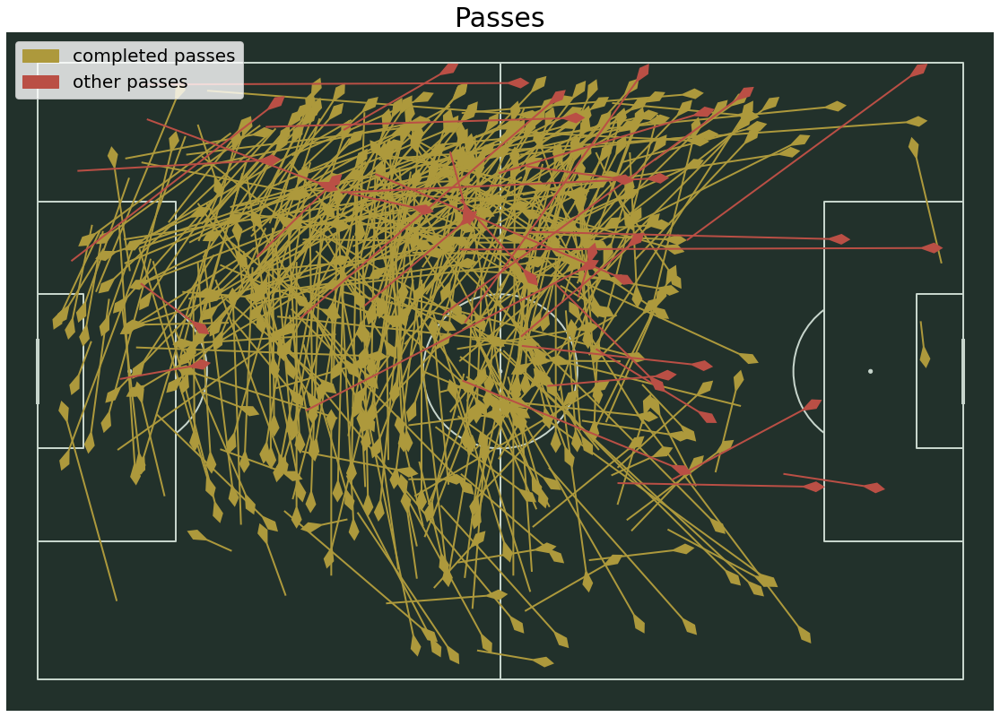

In [22]:
playerpasses('Leah Williamson',euro22)

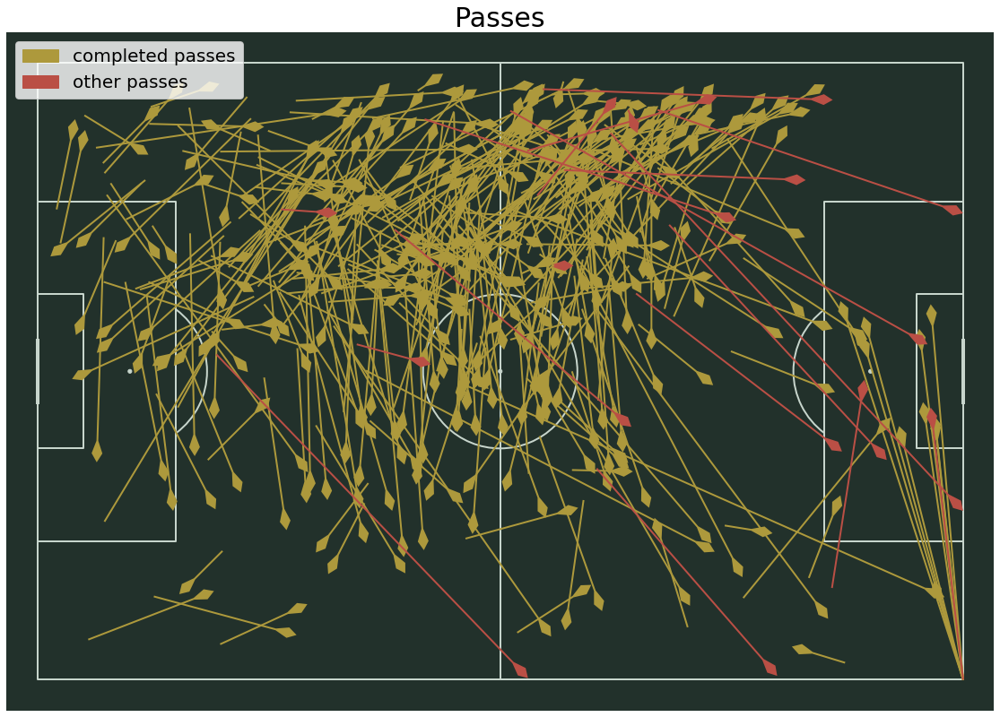

In [23]:
playerpasses('María Pilar León Cebrián',euro22)

### Kmeans for England Womens in Euros 22

In [24]:
columns_final = [#'player_id',
                 #'possession_team_id',
                 'period',
                 #'match_id',
                 #'pass_outcome_Complete',
                 'pass_angle',
                 'pass_length',
                 'start_x', 
                 'start_y', 
                 'end_x', 
                 'end_y',
                 'pass_height_Ground Pass', 
                 'pass_height_High Pass',
                 'pass_height_Low Pass']

# to add : period (to determine which half), 'match_id' to determine opponent

In [25]:
euro22.period = euro22.period.astype('float64')

In [26]:
# features to use
eupasses = euro22[(euro22['possession_team_id'] == 865) & 
                  #(euro22['period'] == 1) &
                 (euro22['pass_outcome_Complete'] == 1)][columns_final]

In [27]:
eupasses.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2693 entries, 0 to 26001
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   period                   2693 non-null   float64
 1   pass_angle               2693 non-null   float64
 2   pass_length              2693 non-null   float64
 3   start_x                  2693 non-null   float64
 4   start_y                  2693 non-null   float64
 5   end_x                    2693 non-null   float64
 6   end_y                    2693 non-null   float64
 7   pass_height_Ground Pass  2693 non-null   uint8  
 8   pass_height_High Pass    2693 non-null   uint8  
 9   pass_height_Low Pass     2693 non-null   uint8  
dtypes: float64(7), uint8(3)
memory usage: 176.2 KB


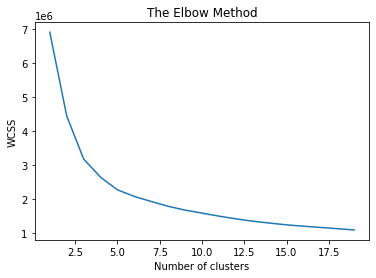

In [28]:
# assessed clusters based on elbow method, however 5 clusters does not provide much insights.
# through trial and error, selected 20 clusters.

X = np.array(eupasses)


wcss = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 20), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [29]:
# cannot standard scaler because i need the feature points to plot clusters

N_clusters = 20
X = np.array(eupasses)

kmeans = KMeans(n_clusters = N_clusters, random_state = 42)
kmeans.fit(X)
cluster_labels = kmeans.predict(X)


In [30]:
kmeans.cluster_centers_

array([[ 1.57798165e+00,  6.78305021e-01,  1.47326591e+01,
         5.13697248e+01,  1.35866972e+01,  4.97178899e+01,
         1.57949541e+01,  8.34862385e-01,  8.25688073e-02,
         8.25688073e-02],
       [ 1.68421053e+00, -8.10253592e-01,  1.82555307e+01,
         6.51394737e+01,  4.99394737e+01,  6.47177632e+01,
         4.09019737e+01,  9.47368421e-01,  1.97368421e-02,
         3.28947368e-02],
       [ 1.68987342e+00, -3.47966974e-01,  1.56979541e+01,
         4.83658228e+01,  4.32746835e+01,  4.63575949e+01,
         3.85677215e+01,  9.24050633e-01,  2.53164557e-02,
         5.06329114e-02],
       [ 1.64417178e+00,  4.98892374e-01,  1.51826915e+01,
         9.32447853e+01,  1.18085890e+01,  9.68214724e+01,
         1.33693252e+01,  7.85276074e-01,  7.97546012e-02,
         1.34969325e-01],
       [ 1.53488372e+00, -1.20256950e+00,  2.89292758e+01,
         1.05411628e+02,  6.19232558e+01,  1.09520930e+02,
         3.71511628e+01,  2.09302326e-01,  6.51162791e-01,
         1.

In [31]:
eupasses['n_cluster'] = cluster_labels
eupasses['period'].value_counts()

2.0    1260
1.0    1239
3.0     120
4.0      74
Name: period, dtype: int64

In [32]:
eupasses['period']

0        1.0
2        1.0
3        1.0
4        1.0
5        1.0
6        1.0
7        1.0
8        1.0
13       1.0
14       1.0
15       1.0
16       1.0
17       1.0
18       1.0
19       1.0
29       1.0
30       1.0
32       1.0
33       1.0
34       1.0
35       1.0
42       1.0
43       1.0
44       1.0
45       1.0
46       1.0
47       1.0
48       1.0
49       1.0
50       1.0
53       1.0
67       1.0
68       1.0
69       1.0
70       1.0
80       1.0
81       1.0
84       1.0
85       1.0
105      1.0
106      1.0
107      1.0
108      1.0
109      1.0
110      1.0
111      1.0
116      1.0
117      1.0
118      1.0
121      1.0
122      1.0
123      1.0
127      1.0
128      1.0
129      1.0
130      1.0
131      1.0
132      1.0
141      1.0
142      1.0
152      1.0
153      1.0
154      1.0
157      1.0
158      1.0
159      1.0
161      1.0
162      1.0
163      1.0
165      1.0
166      1.0
167      1.0
168      1.0
180      1.0
181      1.0
182      1.0
183      1.0

In [33]:
eupasses['n_cluster'].value_counts()

15    236
0     218
13    192
18    180
5     169
14    169
7     168
3     163
2     158
1     152
9     144
8     115
6     114
10    110
17    108
11     81
12     75
19     60
4      43
16     38
Name: n_cluster, dtype: int64

In [34]:
sorted(eupasses['n_cluster'].unique())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

In [35]:
centroids = pd.DataFrame(data = kmeans.cluster_centers_, columns = columns_final)

In [36]:
centroids.iloc[[11,12,19]]

,period,pass_angle,pass_length,start_x,start_y,end_x,end_y,pass_height_Ground Pass,pass_height_High Pass,pass_height_Low Pass
11,1.592593,-0.668573,32.157544,34.681481,29.851852,57.290123,13.540741,0.629630,0.283951,0.086420
12,1.626667,0.754705,42.551529,59.392000,44.016000,88.702667,70.697333,0.400000,0.533333,0.066667
19,1.566667,-0.734310,41.208575,59.640000,33.401667,88.515000,9.481667,0.416667,0.566667,0.016667


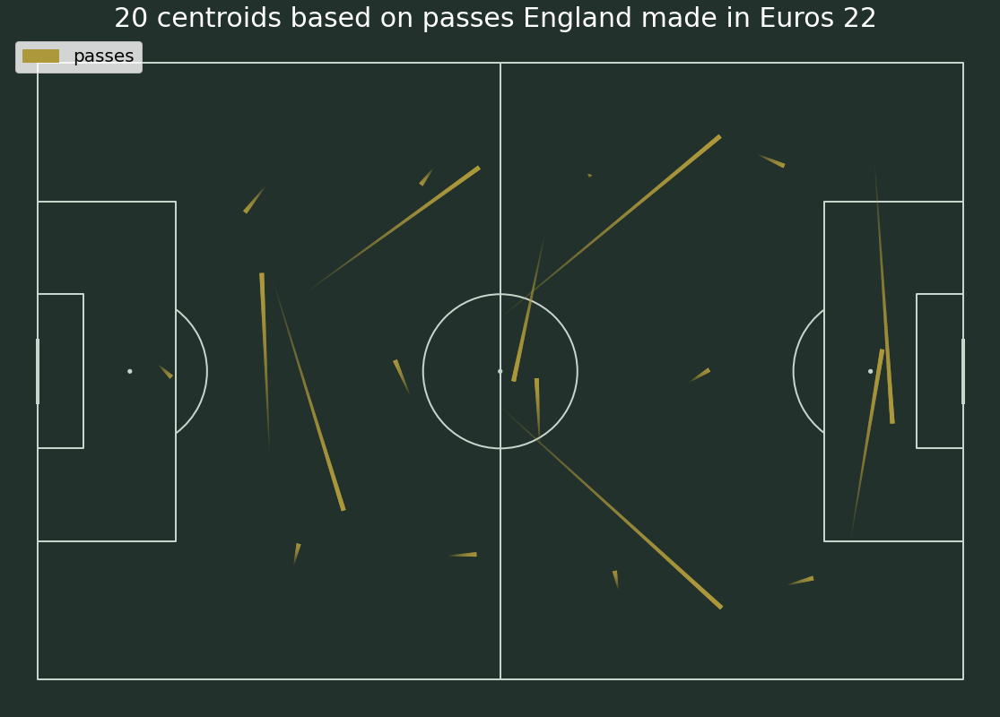

In [37]:
pitch = Pitch(pitch_type='statsbomb', pitch_color='#22312b', line_color='#c7d5cc')
fig, ax = pitch.draw(figsize=(16, 11), constrained_layout=True, tight_layout=False)

lc1 = pitch.lines(centroids['start_x'], centroids['start_y'],
                  centroids['end_x'], centroids['end_y'],
                  lw=5, transparent=True, comet=True,
                  color='#ad993c', ax=ax)
# Plot the legend
red_patch = mpatches.Patch(color='#ad993c', label='passes')
ax.legend(handles=[red_patch], fontsize=20, loc='upper left')
# Set the title
ax.set_title(f'20 centroids based on passes England made in Euros 22 ', fontsize=30, color = 'white')
# Set the figure facecolor
fig.set_facecolor('#22312b')

In [38]:
pd.set_option('display.max_rows', None)
eupasses_0 = eupasses[eupasses.n_cluster == 0]
eupasses_0.describe()

,period,pass_angle,pass_length,start_x,start_y,end_x,end_y,pass_height_Ground Pass,pass_height_High Pass,pass_height_Low Pass,n_cluster
count,218.000000,218.000000,218.000000,218.000000,218.000000,218.000000,218.000000,218.000000,218.000000,218.000000,218.0
mean,1.577982,0.678305,14.732659,51.369725,13.586697,49.717890,15.794954,0.834862,0.082569,0.082569,0.0
std,0.676036,1.797024,5.513794,8.656858,7.513463,8.284426,8.564347,0.372159,0.275863,0.275863,0.0
min,1.000000,-3.108272,2.088061,32.700000,0.100000,30.100000,0.500000,0.000000,0.000000,0.000000,0.0
25%,1.000000,-0.817197,11.095328,44.550000,7.525000,43.700000,8.825000,1.000000,0.000000,0.000000,0.0
50%,1.000000,0.964026,14.320252,50.700000,13.850000,49.450000,14.600000,1.000000,0.000000,0.000000,0.0
75%,2.000000,2.395837,17.927839,56.675000,19.075000,55.600000,22.400000,1.000000,0.000000,0.000000,0.0
max,4.000000,3.141593,41.512047,70.400000,34.900000,72.100000,36.300000,1.000000,1.000000,1.000000,0.0


In [39]:
eupasses['n_cluster'].unique()

array([ 2,  3, 15,  0, 10,  6, 12, 13,  1, 11, 14,  7,  9, 19, 16,  5,  8,
       17, 18,  4])

In [40]:
def plot_clusters(df, name):
    n_clusters = eupasses['n_cluster'].nunique()
    pitch = Pitch(pitch_type='statsbomb', pitch_color='#22312b', line_color='#c7d5cc')
    fig, ax = pitch.draw(figsize=(10, 10), constrained_layout=True, tight_layout=False)
    
    colors = plt.cm.Spectral(np.linspace(0, 1, n_clusters))
    
    for lbl, col in zip(eupasses['n_cluster'].unique(), colors):
        #df_cluster = passes[passes['n_cluster'] == lbl]
        lc1 = pitch.arrows(eupasses[eupasses['n_cluster'] == lbl]['start_x'], 
                    eupasses[eupasses['n_cluster'] == lbl]['start_y'],
                    eupasses[eupasses['n_cluster'] == lbl]['end_x'],
                    eupasses[eupasses['n_cluster'] == lbl]['end_y'],
                    width=2,headwidth=6, headlength=5, headaxislength=12,color=col,ax=ax,
                       label=lbl)

    ax.legend(loc='lower right')
    ax.set_title(name, fontsize=20)
    plt.show()

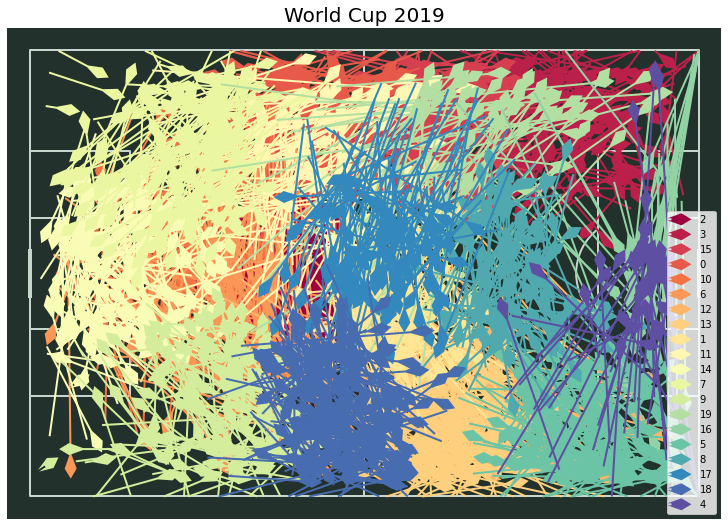

In [41]:
plot_clusters(eupasses, 'World Cup 2019')

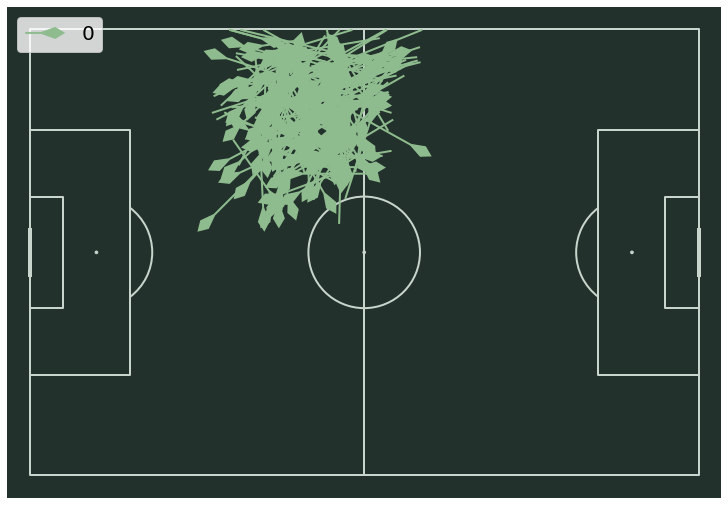

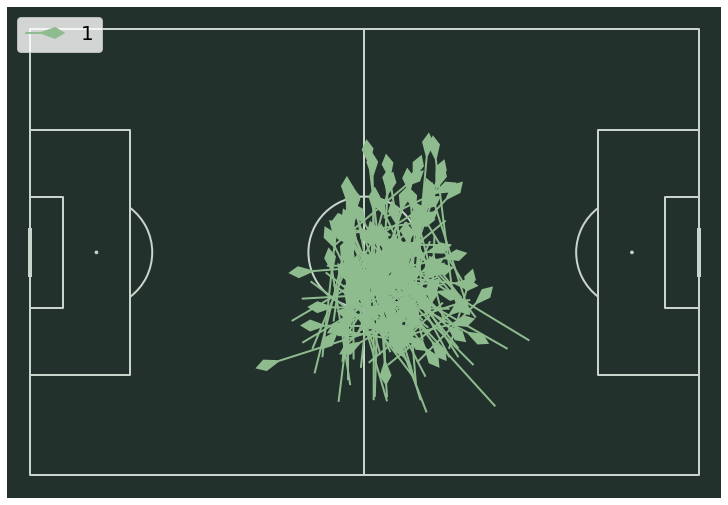

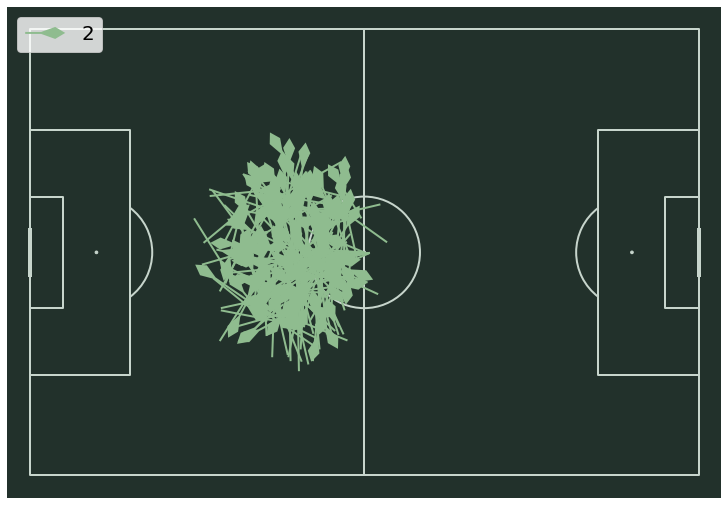

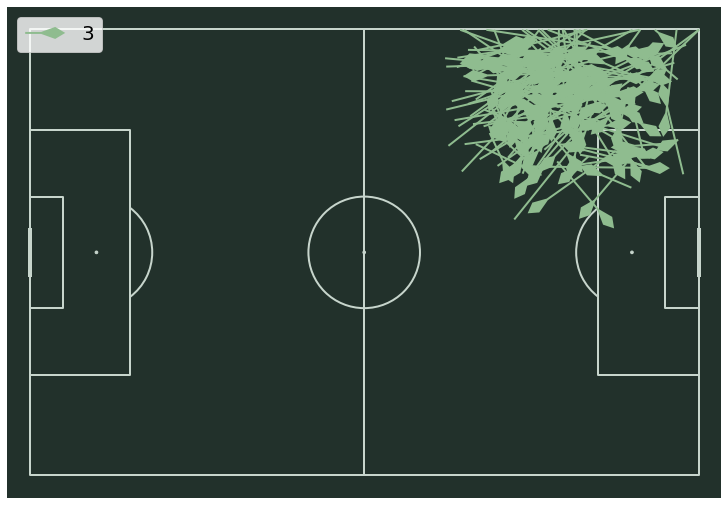

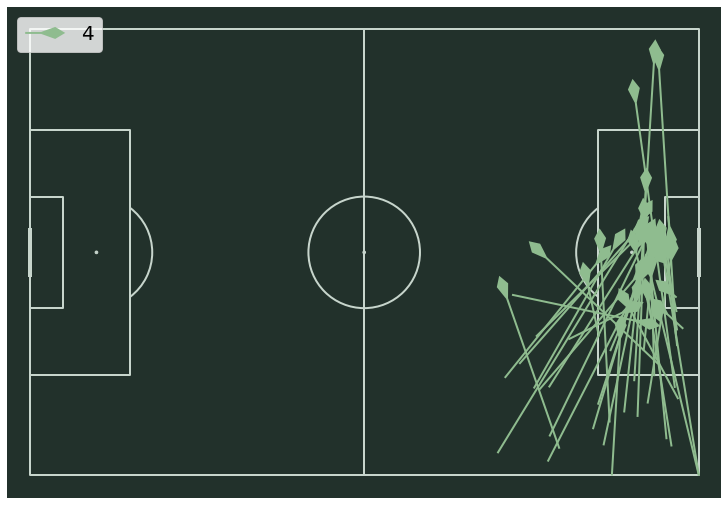

...

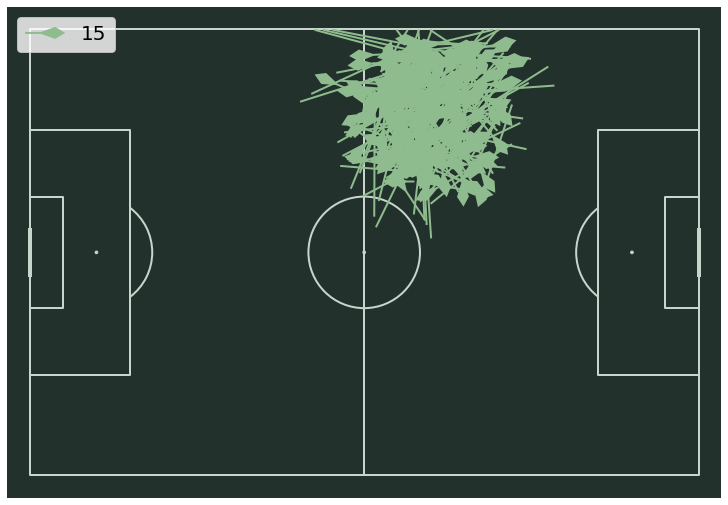

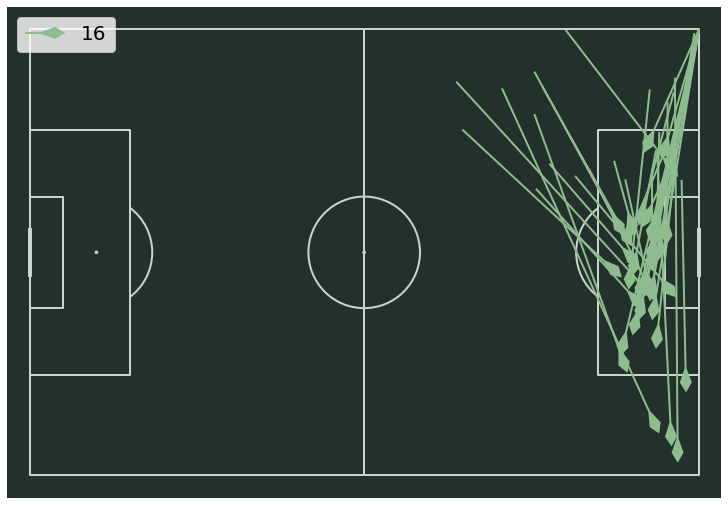

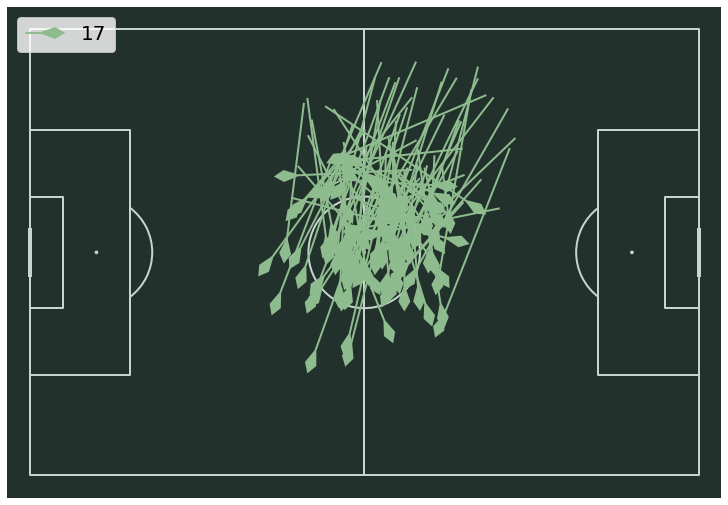

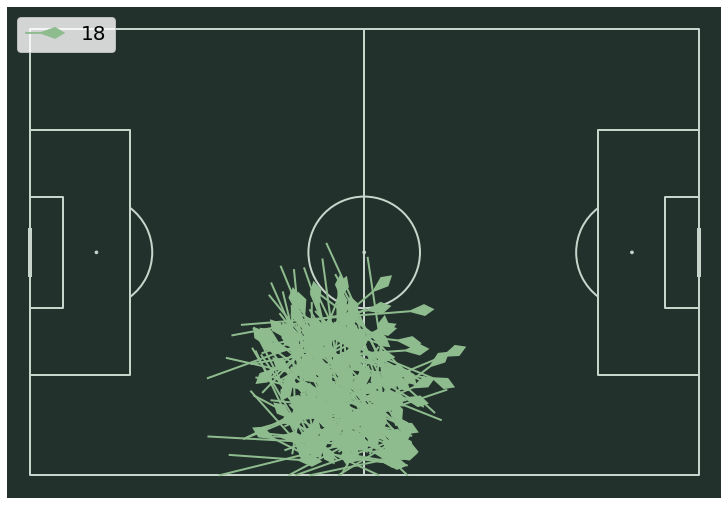

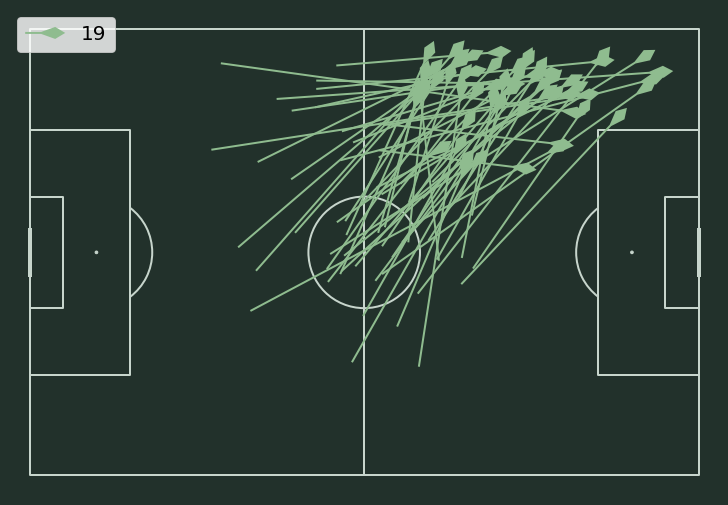

In [42]:
# pulling out passes for analysis by cluster

for c in sorted(eupasses['n_cluster'].unique()) :
    
    pitch = Pitch(pitch_type='statsbomb', pitch_color='#22312b', line_color='#c7d5cc')
    fig, ax = pitch.draw(figsize=(10, 10), constrained_layout=True, tight_layout=False)

    lc1 = pitch.arrows(eupasses[eupasses['n_cluster'] == c]['start_x'], 
                      eupasses[eupasses['n_cluster'] == c]['start_y'],
                      eupasses[eupasses['n_cluster'] == c]['end_x'],
                      eupasses[eupasses['n_cluster'] == c]['end_y'],
                      width=2,headwidth=6, headlength=5, headaxislength=12,color='darkseagreen',ax=ax,
                       label=c)
# Plot the legend

    ax.legend(fontsize=20, loc='upper left')
# Set the title
#ax.set_title(f'5 Main passes Lucy Bronze made in the past 3 years ', fontsize=30, color = 'white')
# Set the figure facecolor
fig.set_facecolor('#22312b')

In [43]:
def pass_analysis(cluster,df):
    df = df[df.n_cluster == cluster]
    
    analysis = euro22.iloc[df.index]
    
    return analysis

In [44]:
analysis_6 = pass_analysis(6,eupasses)
analysis_6.describe()

,period,pass_angle,pass_length,possession_team_id,player_id,match_id,pass_outcome_Complete,pass_outcome_Incomplete,pass_outcome_Injury Clearance,pass_outcome_Out,pass_outcome_Pass Offside,pass_outcome_Unknown,start_x,start_y,end_x,end_y,pass_height_Ground Pass,pass_height_High Pass,pass_height_Low Pass
count,114.000000,114.000000,114.000000,114.0,114.000000,1.140000e+02,114.0,114.0,114.0,114.0,114.0,114.0,114.000000,114.000000,114.000000,114.000000,114.000000,114.000000,114.000000
mean,1.578947,1.306734,36.846301,865.0,21089.403509,3.841383e+06,1.0,0.0,0.0,0.0,0.0,0.0,30.450000,27.949123,39.705263,58.053509,0.710526,0.254386,0.035088
std,0.785879,0.535936,10.157018,0.0,32522.989324,5.387423e+03,0.0,0.0,0.0,0.0,0.0,0.0,13.200156,10.927097,13.341975,9.459127,0.455520,0.437438,0.184814
min,1.000000,-0.009685,18.797073,865.0,4641.000000,3.835319e+06,1.0,0.0,0.0,0.0,0.0,0.0,4.300000,6.200000,3.100000,38.100000,0.000000,0.000000,0.000000
25%,1.000000,0.969219,28.913139,865.0,5058.000000,3.835327e+06,1.0,0.0,0.0,0.0,0.0,0.0,19.325000,20.000000,31.550000,52.075000,0.000000,0.000000,0.000000
50%,1.000000,1.483026,35.146725,865.0,18999.000000,3.844384e+06,1.0,0.0,0.0,0.0,0.0,0.0,33.250000,26.750000,38.200000,56.250000,1.000000,0.000000,0.000000
75%,2.000000,1.691836,43.853278,865.0,18999.000000,3.845506e+06,1.0,0.0,0.0,0.0,0.0,0.0,41.225000,36.000000,47.875000,65.175000,1.000000,0.750000,0.000000
max,4.000000,2.438238,62.328564,865.0,276302.000000,3.847567e+06,1.0,0.0,0.0,0.0,0.0,0.0,51.400000,58.100000,70.700000,77.200000,1.000000,1.000000,1.000000


In [45]:
analysis_6.match_id.value_counts()

3847567    26
3844384    22
3835319    21
3835327    20
3845506    17
3835335     8
Name: match_id, dtype: int64

In [46]:
analysis_6.player.value_counts()

Leah Williamson         48
Mary Alexandra Earps    23
Keira Walsh             15
Rachel Daly             11
Millie Bright            5
Georgia Stanway          3
Francesca Kirby          2
Alex Greenwood           2
Ella Toone               2
Guro Pettersen           1
Fridolina Rolfö          1
Jacqueline Burns         1
Name: player, dtype: int64

In [47]:
analysis_6.pass_recipient.value_counts()

Millie Bright            47
Lucy Bronze              39
Georgia Stanway           5
Bethany Mead              5
Alessia Russo             4
Keira Walsh               4
Mary Alexandra Earps      3
Ada Stolsmo Hegerberg     1
Eva Sofia Jakobsson       1
Francesca Kirby           1
Rebecca Mckenna           1
Leah Williamson           1
Ellen White               1
Chloe Kelly               1
Name: pass_recipient, dtype: int64

In [48]:
analysis_12 = pass_analysis(12,eupasses)
analysis_12.describe()

,period,pass_angle,pass_length,possession_team_id,player_id,match_id,pass_outcome_Complete,pass_outcome_Incomplete,pass_outcome_Injury Clearance,pass_outcome_Out,pass_outcome_Pass Offside,pass_outcome_Unknown,start_x,start_y,end_x,end_y,pass_height_Ground Pass,pass_height_High Pass,pass_height_Low Pass
count,75.000000,75.000000,75.000000,75.0,75.000000,7.500000e+01,75.0,75.0,75.0,75.0,75.0,75.0,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000
mean,1.626667,0.754705,42.551529,865.0,8781.573333,3.838543e+06,1.0,0.0,0.0,0.0,0.0,0.0,59.392000,44.016000,88.702667,70.697333,0.400000,0.533333,0.066667
std,0.712311,0.382162,9.979379,0.0,8896.402039,4.769234e+03,0.0,0.0,0.0,0.0,0.0,0.0,12.007247,12.285171,12.542931,6.311144,0.493197,0.502247,0.251124
min,1.000000,-0.251504,25.271526,865.0,4641.000000,3.835319e+06,1.0,0.0,0.0,0.0,0.0,0.0,23.000000,12.200000,63.300000,47.000000,0.000000,0.000000,0.000000
25%,1.000000,0.573005,35.972375,865.0,4642.000000,3.835327e+06,1.0,0.0,0.0,0.0,0.0,0.0,54.150000,37.250000,78.400000,68.100000,0.000000,0.000000,0.000000
50%,2.000000,0.764125,43.214000,865.0,4658.000000,3.835335e+06,1.0,0.0,0.0,0.0,0.0,0.0,61.600000,44.100000,87.900000,72.800000,0.000000,1.000000,0.000000
75%,2.000000,1.027589,49.559370,865.0,10215.000000,3.844384e+06,1.0,0.0,0.0,0.0,0.0,0.0,66.500000,52.550000,98.150000,75.200000,1.000000,1.000000,0.000000
max,4.000000,1.535097,71.943450,865.0,47521.000000,3.847567e+06,1.0,0.0,0.0,0.0,0.0,0.0,84.500000,67.000000,117.400000,77.800000,1.000000,1.000000,1.000000


In [49]:
analysis_12.match_id.value_counts()

3835327    20
3835335    18
3835319    13
3844384    12
3845506     7
3847567     5
Name: match_id, dtype: int64

In [50]:
analysis_12.player.value_counts()

Keira Walsh             26
Millie Bright           21
Leah Williamson          8
Georgia Stanway          6
Alex Greenwood           6
Alessia Russo            2
Lucy Bronze              2
Lauren Hemp              1
Mary Alexandra Earps     1
Ella Toone               1
Francesca Kirby          1
Name: player, dtype: int64

In [51]:
analysis_12.pass_recipient.value_counts()

Lucy Bronze       31
Bethany Mead      27
Lauren Hemp        8
Chloe Kelly        3
Alessia Russo      2
Nikita Parris      2
Ella Toone         1
Jessica Carter     1
Name: pass_recipient, dtype: int64

In [52]:
analysis_17 = pass_analysis(17,eupasses)
analysis_17.describe()

,period,pass_angle,pass_length,possession_team_id,player_id,match_id,pass_outcome_Complete,pass_outcome_Incomplete,pass_outcome_Injury Clearance,pass_outcome_Out,pass_outcome_Pass Offside,pass_outcome_Unknown,start_x,start_y,end_x,end_y,pass_height_Ground Pass,pass_height_High Pass,pass_height_Low Pass
count,108.000000,108.000000,108.000000,108.0,108.000000,1.080000e+02,108.0,108.0,108.0,108.0,108.0,108.0,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000
mean,1.648148,1.607107,23.262976,865.0,11897.768519,3.837797e+06,1.0,0.0,0.0,0.0,0.0,0.0,65.800000,22.100000,61.723148,41.300926,0.888889,0.101852,0.009259
std,0.616211,0.832942,9.294198,0.0,8920.225210,4.452191e+03,0.0,0.0,0.0,0.0,0.0,0.0,9.068297,7.740946,8.699260,7.998230,0.315735,0.303863,0.096225
min,1.000000,-2.693448,6.811755,865.0,4641.000000,3.835319e+06,1.0,0.0,0.0,0.0,0.0,0.0,46.900000,5.800000,41.000000,22.700000,0.000000,0.000000,0.000000
25%,1.000000,1.392564,16.460310,865.0,4658.000000,3.835319e+06,1.0,0.0,0.0,0.0,0.0,0.0,59.325000,16.275000,55.750000,35.525000,1.000000,0.000000,0.000000
50%,2.000000,1.727011,22.492354,865.0,5058.000000,3.835335e+06,1.0,0.0,0.0,0.0,0.0,0.0,65.450000,23.650000,62.600000,42.000000,1.000000,0.000000,0.000000
75%,2.000000,2.028970,29.732578,865.0,18999.000000,3.835335e+06,1.0,0.0,0.0,0.0,0.0,0.0,71.075000,27.300000,67.200000,46.625000,1.000000,0.000000,0.000000
max,4.000000,3.093243,51.734127,865.0,47521.000000,3.847567e+06,1.0,0.0,0.0,0.0,0.0,0.0,87.100000,34.500000,81.900000,61.700000,1.000000,1.000000,1.000000


In [53]:
analysis_17.match_id.value_counts()

3835335    33
3835319    28
3835327    21
3844384    11
3845506     8
3847567     7
Name: match_id, dtype: int64

In [54]:
analysis_17.player.value_counts()

Leah Williamson    38
Rachel Daly        25
Keira Walsh        23
Georgia Stanway     5
Alex Greenwood      5
Ella Toone          3
Francesca Kirby     3
Lauren Hemp         2
Alessia Russo       2
Millie Bright       1
Bethany Mead        1
Name: player, dtype: int64

In [55]:
analysis_17.pass_recipient.value_counts()

Millie Bright      50
Leah Williamson    16
Keira Walsh        16
Georgia Stanway     7
Alex Greenwood      6
Lucy Bronze         4
Alessia Russo       3
Ellen White         2
Lauren Hemp         1
Francesca Kirby     1
Chloe Kelly         1
Bethany Mead        1
Name: pass_recipient, dtype: int64

In [56]:
analysis_8 = pass_analysis(8,eupasses)
analysis_8.describe()

,period,pass_angle,pass_length,possession_team_id,player_id,match_id,pass_outcome_Complete,pass_outcome_Incomplete,pass_outcome_Injury Clearance,pass_outcome_Out,pass_outcome_Pass Offside,pass_outcome_Unknown,start_x,start_y,end_x,end_y,pass_height_Ground Pass,pass_height_High Pass,pass_height_Low Pass
count,115.000000,115.000000,115.000000,115.0,115.000000,1.150000e+02,115.0,115.0,115.0,115.0,115.0,115.0,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000
mean,1.695652,-0.170055,16.619636,865.0,12313.886957,3.839769e+06,1.0,0.0,0.0,0.0,0.0,0.0,84.420000,41.458261,87.100870,39.791304,0.886957,0.069565,0.043478
std,0.739534,1.626987,7.231113,0.0,10960.194672,5.242918e+03,0.0,0.0,0.0,0.0,0.0,0.0,7.112026,10.196774,7.947608,11.083571,0.318032,0.255526,0.204824
min,1.000000,-3.059425,3.397057,865.0,4641.000000,3.835319e+06,1.0,0.0,0.0,0.0,0.0,0.0,69.200000,20.200000,66.300000,15.800000,0.000000,0.000000,0.000000
25%,1.000000,-1.571697,10.532320,865.0,4643.000000,3.835335e+06,1.0,0.0,0.0,0.0,0.0,0.0,78.850000,32.550000,82.200000,31.500000,1.000000,0.000000,0.000000
50%,2.000000,-0.537045,16.389326,865.0,4658.000000,3.835335e+06,1.0,0.0,0.0,0.0,0.0,0.0,84.700000,41.700000,86.000000,41.000000,1.000000,0.000000,0.000000
75%,2.000000,1.328894,21.324933,865.0,15619.000000,3.845506e+06,1.0,0.0,0.0,0.0,0.0,0.0,89.750000,48.700000,92.200000,48.450000,1.000000,0.000000,0.000000
max,4.000000,3.019132,36.638367,865.0,47521.000000,3.847567e+06,1.0,0.0,0.0,0.0,0.0,0.0,97.800000,61.800000,111.100000,65.800000,1.000000,1.000000,1.000000


In [57]:
analysis_8.player.value_counts()

Keira Walsh        29
Francesca Kirby    13
Georgia Stanway    12
Ella Toone         12
Leah Williamson    12
Lauren Hemp         8
Millie Bright       5
Alex Greenwood      5
Lucy Bronze         5
Alessia Russo       4
Bethany Mead        4
Rachel Daly         2
Jill Scott          2
Ellen White         1
Chloe Kelly         1
Name: player, dtype: int64

In [58]:
analysis_8.pass_recipient.value_counts()

Keira Walsh        21
Georgia Stanway    13
Francesca Kirby    11
Ella Toone         10
Bethany Mead       10
Lauren Hemp         9
Rachel Daly         7
Alex Greenwood      7
Leah Williamson     7
Alessia Russo       6
Lucy Bronze         4
Jill Scott          3
Ellen White         3
Chloe Kelly         3
Nikita Parris       1
Name: pass_recipient, dtype: int64

In [91]:
silhouette_score(X, cluster_labels)

0.22272935562662483

## PCA

### Attempt to cluster with DBScan

In [92]:
eupasses_db = euro22[(euro22['possession_team_id'] == 865) & 
                  #(euro22['period'] == 1) &
                 (euro22['pass_outcome_Complete'] == 1)][columns_final]

In [93]:
eupasses_db

,period,pass_angle,pass_length,start_x,start_y,end_x,end_y,pass_height_Ground Pass,pass_height_High Pass,pass_height_Low Pass
0,1.0,2.938882,25.828860,61.0,40.1,35.7,45.3,1,0,0
2,1.0,-3.068195,13.636715,92.1,7.3,78.5,6.3,0,0,1
3,1.0,2.119346,10.547511,76.6,6.0,71.1,15.0,1,0,0
4,1.0,-2.624105,14.958610,69.7,16.6,56.7,9.2,1,0,0
5,1.0,2.356194,38.042343,57.0,9.4,30.1,36.3,1,0,0
6,1.0,-1.553944,17.802528,36.5,39.2,36.8,21.4,1,0,0
7,1.0,1.608616,37.026478,36.8,21.4,35.4,58.4,1,0,0
8,1.0,0.304703,42.665325,43.9,64.2,84.6,77.0,0,1,0
13,1.0,-0.968120,13.231024,64.4,69.3,71.9,58.4,1,0,0
14,1.0,-3.132291,21.500930,70.0,53.3,48.5,53.1,1,0,0


In [94]:
from sklearn.neighbors import NearestNeighbors

In [95]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(eupasses_db)
distances, indices = nbrs.kneighbors(eupasses_db)

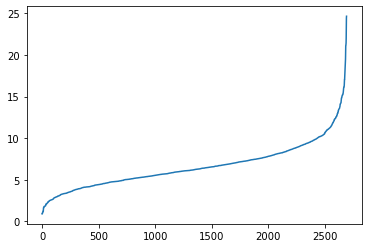

In [101]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [102]:
#ss = StandardScaler()
#X_scaled = ss.fit_transform(eupasses_db)
X_db = np.array(eupasses_db)
dbscan = DBSCAN(eps=10, min_samples=5)
dbscan.fit(X_db)

DBSCAN(eps=10)

In [103]:
silhouette_score(X_db, dbscan.labels_)

-0.4856717277375414

In [104]:
eupasses_db['n_cluster'] = dbscan.labels_

In [105]:
eupasses_db['n_cluster'].unique()

array([-1,  0,  1,  2, 17,  3,  4, 15, 11, 21, 16, 18, 22,  6,  5,  7,  8,
        9, 10, 12, 20, 14, 13, 19], dtype=int64)

C:\Users\connie\anaconda3\lib\site-packages\mplsoccer\_pitch_base.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize,


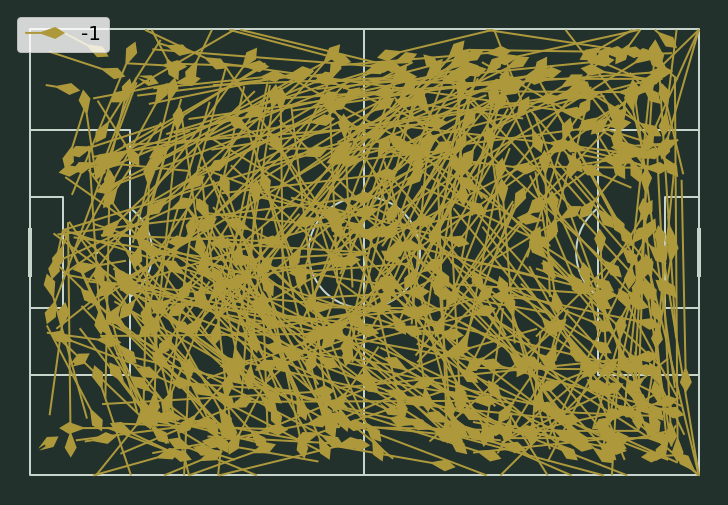

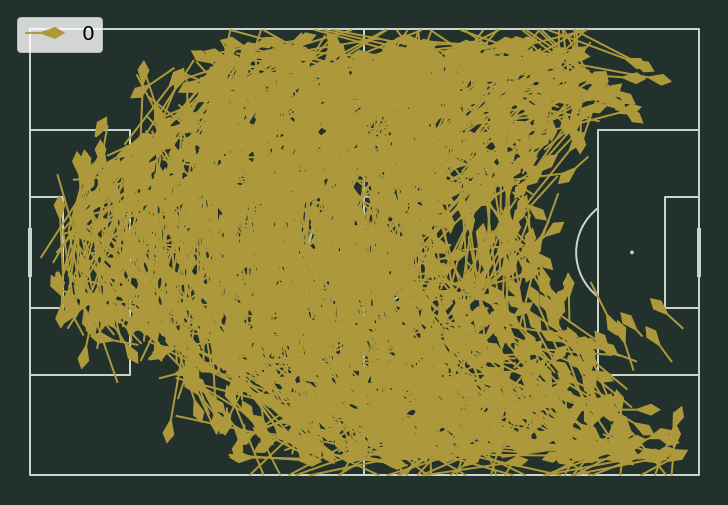

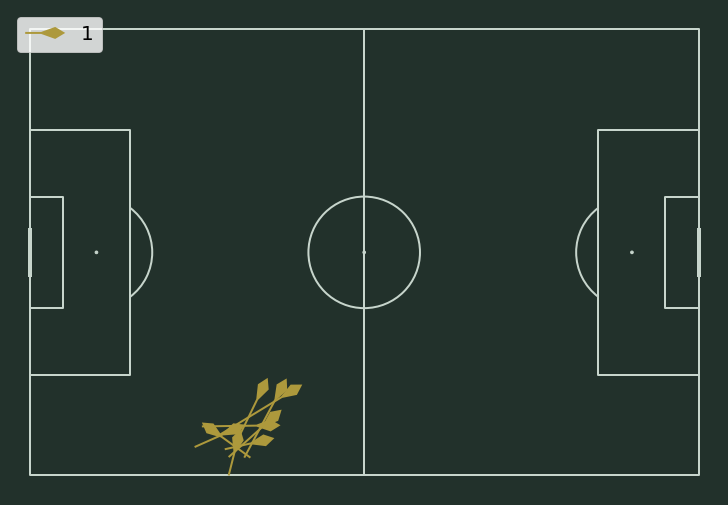

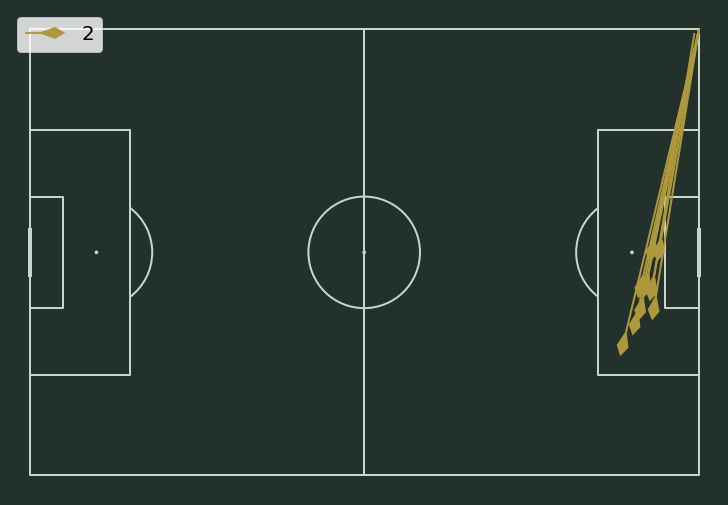

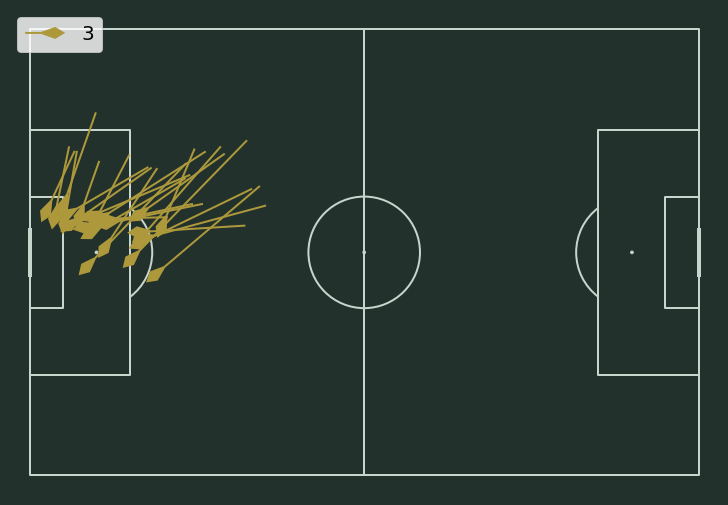

...

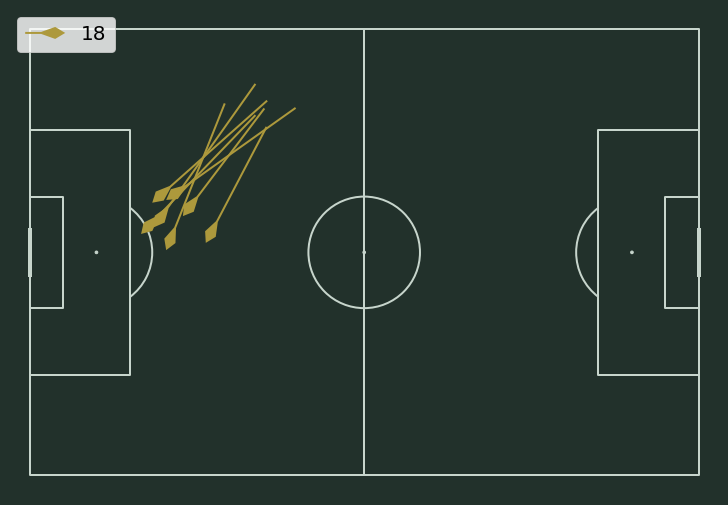

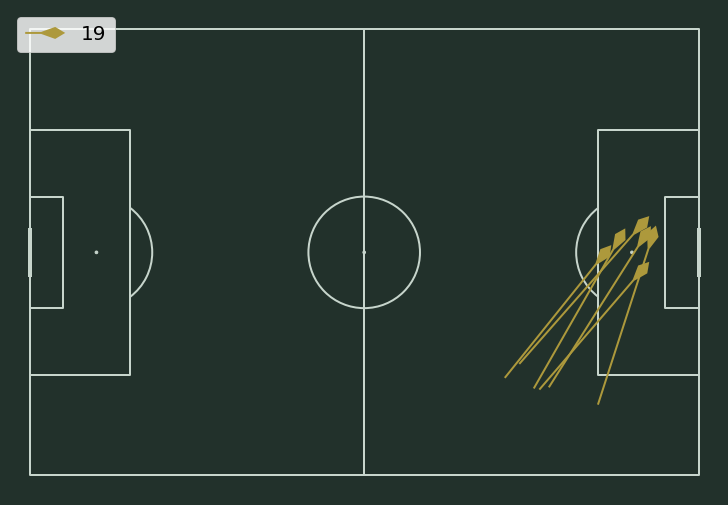

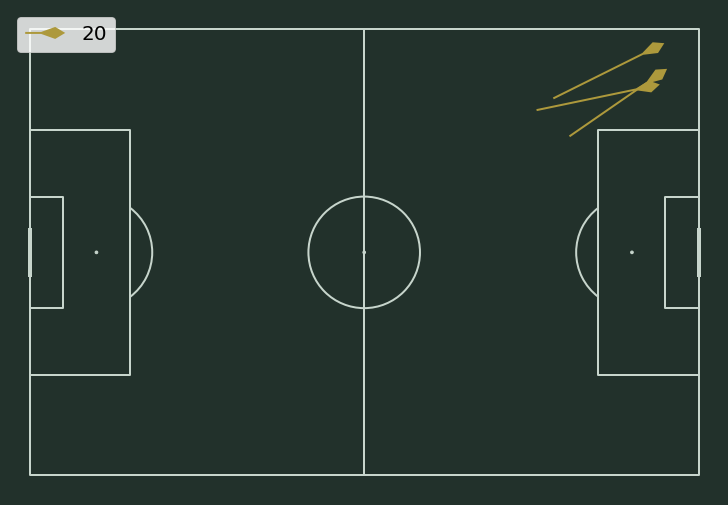

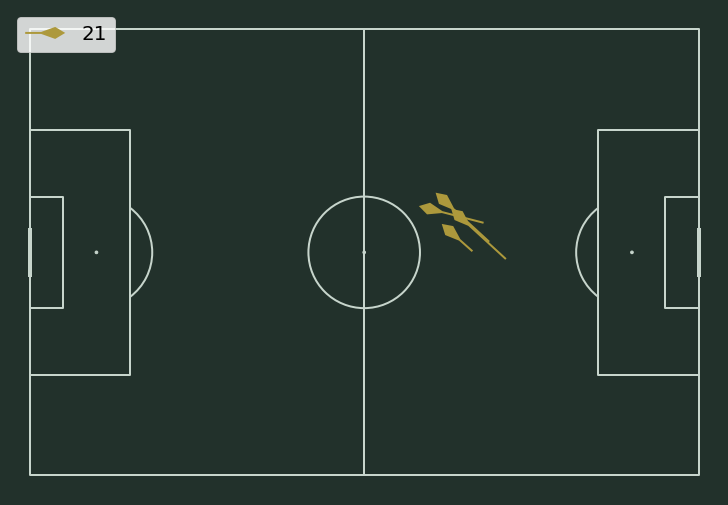

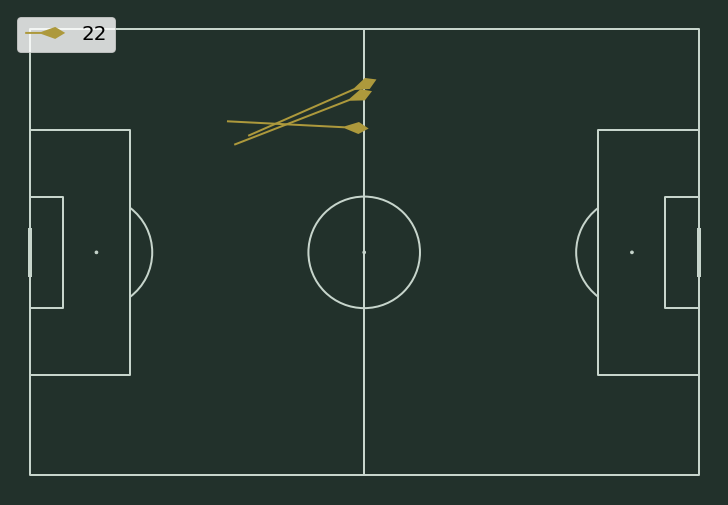

In [106]:
for c in sorted(eupasses_db['n_cluster'].unique()) :
    
    pitch = Pitch(pitch_type='statsbomb', pitch_color='#22312b', line_color='#c7d5cc')
    fig, ax = pitch.draw(figsize=(10, 10), constrained_layout=True, tight_layout=False)

    lc1 = pitch.arrows(eupasses_db[eupasses_db['n_cluster'] == c]['start_x'], 
                      eupasses_db[eupasses_db['n_cluster'] == c]['start_y'],
                      eupasses_db[eupasses_db['n_cluster'] == c]['end_x'],
                      eupasses_db[eupasses_db['n_cluster'] == c]['end_y'],
                      width=2,headwidth=6, headlength=5, headaxislength=12,color='#ad993c',ax=ax,
                       label=c)
# Plot the legend

    ax.legend(fontsize=20, loc='upper left')
# Set the title
#ax.set_title(f'5 Main passes Keira Walsh made in the past 3 years ', fontsize=30, color = 'white')
# Set the figure facecolor
    fig.set_facecolor('#22312b')